In [ ]:
#Базовые библиотеки и визуализация
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('dataset.csv')
df

,docid,docnumber,docdate,parent,request
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03,413936.0,1022200907794
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03,412442.0,1030100510461
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03,412854.0,1024200721797
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03,412293.0,1026605402394
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03,413570.0,1026401590610
...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.55553+03,NaN,1022701290116
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03,428856.0,1022200814030
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03,453037.0,1025602002007
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03,462182.0,1022900540552


In [ ]:
df['parent'].fillna(0, inplace=True)
df['parent'] = df['parent'].astype('int')
df

,docid,docnumber,docdate,parent,request
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03,413936,1022200907794
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03,412442,1030100510461
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03,412854,1024200721797
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03,412293,1026605402394
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03,413570,1026401590610
...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.55553+03,0,1022701290116
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03,428856,1022200814030
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03,453037,1025602002007
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03,462182,1022900540552


In [ ]:
print(df)

       docid       docnumber                        docdate  parent  \
0     414051  ОП-З-00073-001  2023-06-23 09:14:12.352472+03  413936   
1     412740   О-З-00017-002  2023-06-20 14:26:02.272314+03  412442   
2     412900  ОП-З-00028-001  2023-06-21 09:08:10.800947+03  412854   
3     412304  ОП-З-00005-001  2023-06-19 16:39:11.096665+03  412293   
4     413761  ОП-З-00055-002  2023-06-22 14:44:21.289675+03  413570   
...      ...             ...                            ...     ...   
6615  456664         З-01353   2023-08-31 10:17:01.55553+03       0   
6616  458095   О-З-00484-001  2023-09-04 04:20:01.573455+03  428856   
6617  457918   О-З-01242-003  2023-09-01 16:14:01.734741+03  453037   
6618  464058   О-З-01517-001  2023-09-06 15:03:02.257644+03  462182   
6619  459873   О-З-01451-001  2023-09-04 14:43:01.601127+03  459795   

            request  
0     1022200907794  
1     1030100510461  
2     1024200721797  
3     1026605402394  
4     1026401590610  
...            

In [ ]:
df.describe()

,docid,parent
count,6620.000000,6620.000000
mean,475361.210725,329809.569940
std,35598.036472,220409.910608
min,412203.000000,0.000000
25%,445307.250000,0.000000
50%,474713.500000,449461.000000
75%,507585.750000,488963.750000
max,535193.000000,535015.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6620 entries, 0 to 6619
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   docid      6620 non-null   int64 
 1   docnumber  6620 non-null   object
 2   docdate    6620 non-null   object
 3   parent     6620 non-null   int64 
 4   request    6620 non-null   object
dtypes: int64(2), object(3)
memory usage: 258.7+ KB


In [ ]:
import pandas as pd

# Преобразовать столбец docdate в тип данных datetime
df['docdate'] = pd.to_datetime(df['docdate'])

# Добавить столбцы с датой и часовым поясом
df['date'] = df['docdate'].dt.date
df['hour'] = df['docdate'].dt.hour

# Группировать данные по дате и часовому поясу, подсчитать количество запросов
requests_by_date_hour = df.groupby(['date', 'hour'])['docid'].count().reset_index(name='request_count')

# Определить пиковые и средние нагрузки на СТПП
peak_load = requests_by_date_hour.loc[requests_by_date_hour['request_count'].argmax()]
avg_load = requests_by_date_hour['request_count'].mean()

# Отобразить пиковые и средние нагрузки
print('Пиковая нагрузка:', peak_load)
print('Средняя нагрузка:', avg_load)


Пиковая нагрузка: date             2023-09-04
hour                     12
request_count            48
Name: 535, dtype: object
Средняя нагрузка: 4.448924731182796


In [ ]:
df

,docid,docnumber,docdate,parent,request,date,hour
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03:00,413936,1022200907794,2023-06-23,9
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03:00,412442,1030100510461,2023-06-20,14
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03:00,412854,1024200721797,2023-06-21,9
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03:00,412293,1026605402394,2023-06-19,16
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03:00,413570,1026401590610,2023-06-22,14
...,...,...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.555530+03:00,0,1022701290116,2023-08-31,10
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03:00,428856,1022200814030,2023-09-04,4
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03:00,453037,1025602002007,2023-09-01,16
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03:00,462182,1022900540552,2023-09-06,15


In [ ]:
!pip install dadata

In [ ]:
YANDEX_API = "7729e866-8064-457f-8e30-13f4715ae61a"

In [ ]:
import asyncio
import pandas as pd
from dadata import DadataAsync

DADATA_TOKEN = 'efc74d39e6fcdbee9116494ab21fcdd2b600c502'

def is_valid_ogrn(ogrn):
    return isinstance(ogrn, str) and len(ogrn) == 13 and ogrn.isdigit()

async def get_region_info(ogrn):
    try:
        async with DadataAsync(DADATA_TOKEN) as dadata:
            response = await dadata.find_by_id("party", ogrn, async_timeout=100)
            if len(response) > 0:
                suggestion = response[0]
                name = suggestion["data"]["name"]["short_with_opf"]
                address = suggestion["data"]["address"]
                city = address["data"]["city"]
                lat = address["data"]["geo_lat"]
                lon = address["data"]["geo_lon"]
                timezone = address["data"]["timezone"]
                federal_district = address["data"]["federal_district"]
                region_with_type = address["data"]["region_with_type"]
                return ogrn, name, federal_district, region_with_type, city, timezone, lat, lon
            else:
                print(f"No results found for OGRN {ogrn}")
                return ogrn, None, None, None, None, None, None, None
    except Exception as e:
        print(f"Error while processing OGRN {ogrn}: {e}")
        return None

async def fetch(orgs):
    tasks = []
    for org in orgs:
        if is_valid_ogrn(org):
            task = asyncio.create_task(get_region_info(org))
            tasks.append(task)
            await asyncio.sleep(0.1)  # добавляем задержку в 0.1 секунды между запросами
    results = await asyncio.gather(*tasks)
    return results

async def main(df):
    unique_orgs = df['request'].unique()
    region_info = await fetch(unique_orgs)
    df_regions = pd.DataFrame(region_info, columns=['request', 'name', 'federal_district', 'region_with_type', 'city', 'timezone', 'lat', 'lon'])
    return df_regions

df_regions = await main(df)

df_regions

Error while processing OGRN 1023701393913: 
Error while processing OGRN 1024800833628: 
Error while processing OGRN 1023302752472: 
No results found for OGRN 1024800834250
No results found for OGRN 1023909018694
No results found for OGRN 2023061477000
No results found for OGRN 2023081767000
No results found for OGRN 2023061577000
No results found for OGRN 2023061677001
No results found for OGRN 2023060877000
No results found for OGRN 2023080167000
No results found for OGRN 2023081867000
No results found for OGRN 3966425111912
No results found for OGRN 2023091367000
No results found for OGRN 1234567890123
No results found for OGRN 1698841384791
No results found for OGRN 1698841366320
No results found for OGRN 1698841363097
No results found for OGRN 1698841398635
No results found for OGRN 1698841360022
No results found for OGRN 1702474124959
No results found for OGRN 1698841369738
No results found for OGRN 1698841375833
No results found for OGRN 1698841357021
No results found for OGRN 14

,request,name,federal_district,region_with_type,city,timezone,lat,lon
0,1022200907794,"КГБОУ ""АЛТАЙСКИЙ КРАЕВОЙ ПЕДАГОГИЧЕСКИЙ ЛИЦЕЙ-...",Сибирский,Алтайский край,Барнаул,UTC+7,53.33927,83.767044
1,1030100510461,УО АМО КОШЕХАБЛЬСКИЙ РАЙОН,Южный,Респ Адыгея,None,UTC+3,44.895884,40.492873
2,1024200721797,"ГБНОУ ""ГМЛИ"", ГБНОУ ""ГУБЕРНАТОРСКИЙ МНОГОПРОФИ...",Сибирский,Кемеровская область - Кузбасс,Кемерово,UTC+7,55.3369049,86.1380722
3,1026605402394,МАОУ СОШ № 76 С УГЛУБЛЕННЫМ ИЗУЧЕНИЕМ ОТДЕЛЬНЫ...,Уральский,Свердловская обл,Екатеринбург,UTC+5,56.8306504,60.6230595
4,1026401590610,"МАОУ ""ГИМНАЗИЯ ИМЕНИ Ю.А. ГАРНАЕВА""",Приволжский,Саратовская обл,Балашов,UTC+4,51.5520858,43.1420728
...,...,...,...,...,...,...,...,...
309,1459102052317,None,None,None,None,None,None,None
310,1698841338161,None,None,None,None,None,None,None
311,1698841383284,None,None,None,None,None,None,None
312,1036602643990,ФГБОУ ВО УГМУ МИНЗДРАВА РОССИИ,Уральский,Свердловская обл,Екатеринбург,UTC+5,56.8329845,60.5763577


# Сломанные ОГРН

In [ ]:
null_requests = df_regions[(df_regions['name'].isnull()) &
                           (df_regions['federal_district'].isnull()) &
                           (df_regions['region_with_type'].isnull()) &
                           (df_regions['city'].isnull()) &
                           (df_regions['timezone'].isnull()) &
                           (df_regions['lat'].isnull()) &
                           (df_regions['lon'].isnull())]['request'].tolist()

In [ ]:
null_requests

[None,
 None,
 None,
 '1024800834250',
 '1023909018694',
 '2023061477000',
 '2023081767000',
 '2023061577000',
 '2023061677001',
 '2023060877000',
 '2023080167000',
 '2023081867000',
 '3966425111912',
 '2023091367000',
 '1234567890123',
 '1698841384791',
 '1698841366320',
 '1698841363097',
 '1698841398635',
 '1698841360022',
 '1702474124959',
 '1698841369738',
 '1698841375833',
 '1698841357021',
 '1459102052317',
 '1698841338161',
 '1698841383284',
 '1698841351899']

In [ ]:
result_df = pd.merge(df, df_regions, on='request', how='left')
result_df

,docid,docnumber,docdate,parent,request,date,hour,name,federal_district,region_with_type,city,timezone,lat,lon
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03:00,413936,1022200907794,2023-06-23,9,"КГБОУ ""АЛТАЙСКИЙ КРАЕВОЙ ПЕДАГОГИЧЕСКИЙ ЛИЦЕЙ-...",Сибирский,Алтайский край,Барнаул,UTC+7,53.33927,83.767044
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03:00,412442,1030100510461,2023-06-20,14,УО АМО КОШЕХАБЛЬСКИЙ РАЙОН,Южный,Респ Адыгея,None,UTC+3,44.895884,40.492873
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03:00,412854,1024200721797,2023-06-21,9,"ГБНОУ ""ГМЛИ"", ГБНОУ ""ГУБЕРНАТОРСКИЙ МНОГОПРОФИ...",Сибирский,Кемеровская область - Кузбасс,Кемерово,UTC+7,55.3369049,86.1380722
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03:00,412293,1026605402394,2023-06-19,16,МАОУ СОШ № 76 С УГЛУБЛЕННЫМ ИЗУЧЕНИЕМ ОТДЕЛЬНЫ...,Уральский,Свердловская обл,Екатеринбург,UTC+5,56.8306504,60.6230595
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03:00,413570,1026401590610,2023-06-22,14,"МАОУ ""ГИМНАЗИЯ ИМЕНИ Ю.А. ГАРНАЕВА""",Приволжский,Саратовская обл,Балашов,UTC+4,51.5520858,43.1420728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.555530+03:00,0,1022701290116,2023-08-31,10,МАОУ СОШ № 77,Дальневосточный,Хабаровский край,Хабаровск,UTC+10,48.5061333,135.0716054
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03:00,428856,1022200814030,2023-09-04,4,"КГБПОУ ""РУБЦОВСКИЙ АГРАРНО-ПРОМЫШЛЕННЫЙ ТЕХНИКУМ""",Сибирский,Алтайский край,Рубцовск,UTC+7,51.524113,81.2151976
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03:00,453037,1025602002007,2023-09-01,16,ГАПОУ ОНТ ИМ. В.А. СОРОКИНА,Приволжский,Оренбургская обл,Орск,UTC+5,51.2450357,58.4626669
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03:00,462182,1022900540552,2023-09-06,15,"ГБПОУ АО ""АРХАНГЕЛЬСКИЙ ПЕДКОЛЛЕДЖ""",Северо-Западный,Архангельская обл,Архангельск,UTC+3,64.5317201,40.5672116


In [ ]:
df_regions.to_csv("regions_data.csv", sep=';', encoding='cp1251' )

In [ ]:
import pytz

# преобразуем столбец docdate в тип datetime
result_df['docdate'] = pd.to_datetime(result_df['docdate'])

# создаем новый столбец local_time
result_df['local_time'] = None

# преобразуем время в локальное для каждой строки
for i, row in result_df.iterrows():
    if row['timezone'] is np.NaN or row['timezone'] is None :
        tz = pytz.timezone('Europe/Moscow')
    else:
        tz = pytz.FixedOffset(int(row['timezone'][3:])*60)
    local_time = row['docdate'].astimezone(tz)
    result_df.at[i, 'local_time'] = local_time


# выводим результат
result_df

,docid,docnumber,docdate,parent,request,date,hour,name,federal_district,region_with_type,city,timezone,lat,lon,local_time
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03:00,413936,1022200907794,2023-06-23,9,"КГБОУ ""АЛТАЙСКИЙ КРАЕВОЙ ПЕДАГОГИЧЕСКИЙ ЛИЦЕЙ-...",Сибирский,Алтайский край,Барнаул,UTC+7,53.33927,83.767044,2023-06-23 13:14:12.352472+07:00
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03:00,412442,1030100510461,2023-06-20,14,УО АМО КОШЕХАБЛЬСКИЙ РАЙОН,Южный,Респ Адыгея,None,UTC+3,44.895884,40.492873,2023-06-20 14:26:02.272314+03:00
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03:00,412854,1024200721797,2023-06-21,9,"ГБНОУ ""ГМЛИ"", ГБНОУ ""ГУБЕРНАТОРСКИЙ МНОГОПРОФИ...",Сибирский,Кемеровская область - Кузбасс,Кемерово,UTC+7,55.3369049,86.1380722,2023-06-21 13:08:10.800947+07:00
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03:00,412293,1026605402394,2023-06-19,16,МАОУ СОШ № 76 С УГЛУБЛЕННЫМ ИЗУЧЕНИЕМ ОТДЕЛЬНЫ...,Уральский,Свердловская обл,Екатеринбург,UTC+5,56.8306504,60.6230595,2023-06-19 18:39:11.096665+05:00
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03:00,413570,1026401590610,2023-06-22,14,"МАОУ ""ГИМНАЗИЯ ИМЕНИ Ю.А. ГАРНАЕВА""",Приволжский,Саратовская обл,Балашов,UTC+4,51.5520858,43.1420728,2023-06-22 15:44:21.289675+04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.555530+03:00,0,1022701290116,2023-08-31,10,МАОУ СОШ № 77,Дальневосточный,Хабаровский край,Хабаровск,UTC+10,48.5061333,135.0716054,2023-08-31 17:17:01.555530+10:00
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03:00,428856,1022200814030,2023-09-04,4,"КГБПОУ ""РУБЦОВСКИЙ АГРАРНО-ПРОМЫШЛЕННЫЙ ТЕХНИКУМ""",Сибирский,Алтайский край,Рубцовск,UTC+7,51.524113,81.2151976,2023-09-04 08:20:01.573455+07:00
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03:00,453037,1025602002007,2023-09-01,16,ГАПОУ ОНТ ИМ. В.А. СОРОКИНА,Приволжский,Оренбургская обл,Орск,UTC+5,51.2450357,58.4626669,2023-09-01 18:14:01.734741+05:00
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03:00,462182,1022900540552,2023-09-06,15,"ГБПОУ АО ""АРХАНГЕЛЬСКИЙ ПЕДКОЛЛЕДЖ""",Северо-Западный,Архангельская обл,Архангельск,UTC+3,64.5317201,40.5672116,2023-09-06 15:03:02.257644+03:00


In [ ]:
result_df.to_csv("result_data.csv", sep=';', encoding='cp1251' )

In [ ]:
import folium

# Группировать данные по дате и часовому поясу, подсчитать количество запросов и получить ОГРН региона
requests_by_date_hour = result_df.groupby(['docdate', 'timezone', 'request']).size().reset_index(name='count').groupby(['docdate', 'timezone']).first()

# Создать карту России
russia_map = folium.Map(location=[60, 100], zoom_start=4)

# Добавить маркеры на карту для каждого региона с указанными координатами
for index, row in requests_by_date_hour.iterrows():
    # Определить координаты региона на основе ОГРН
    df_row = df_regions[df_regions['request'] == row['request']]
    region_coords = (df_row['lat'], df_row['lon'])
    if region_coords:
        # Добавить маркер на карту
        folium.CircleMarker(location=region_coords, radius=10, color='red', fill=True, fill_color='red', popup=f'Количество запросов: {row["count"]}').add_to(russia_map)

# Отобразить карту
russia_map


In [ ]:
result_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6620 entries, 0 to 6619
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype                    
---  ------            --------------  -----                    
 0   docid             6620 non-null   int64                    
 1   docnumber         6620 non-null   object                   
 2   docdate           6620 non-null   datetime64[ns, UTC+03:00]
 3   parent            6620 non-null   int64                    
 4   request           6620 non-null   object                   
 5   date              6620 non-null   object                   
 6   hour              6620 non-null   int32                    
 7   name              6477 non-null   object                   
 8   federal_district  6477 non-null   object                   
 9   region_with_type  6477 non-null   object                   
 10  city              6258 non-null   object                   
 11  timezone          6477 non-null   object   

In [ ]:
result_df

,docid,docnumber,docdate,parent,request,date,hour,name,federal_district,region_with_type,city,timezone,lat,lon,local_time
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03:00,413936,1022200907794,2023-06-23,9,"КГБОУ ""АЛТАЙСКИЙ КРАЕВОЙ ПЕДАГОГИЧЕСКИЙ ЛИЦЕЙ-...",Сибирский,Алтайский край,Барнаул,UTC+7,53.33927,83.767044,2023-06-23 13:14:12.352472+07:00
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03:00,412442,1030100510461,2023-06-20,14,УО АМО КОШЕХАБЛЬСКИЙ РАЙОН,Южный,Респ Адыгея,None,UTC+3,44.895884,40.492873,2023-06-20 14:26:02.272314+03:00
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03:00,412854,1024200721797,2023-06-21,9,"ГБНОУ ""ГМЛИ"", ГБНОУ ""ГУБЕРНАТОРСКИЙ МНОГОПРОФИ...",Сибирский,Кемеровская область - Кузбасс,Кемерово,UTC+7,55.3369049,86.1380722,2023-06-21 13:08:10.800947+07:00
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03:00,412293,1026605402394,2023-06-19,16,МАОУ СОШ № 76 С УГЛУБЛЕННЫМ ИЗУЧЕНИЕМ ОТДЕЛЬНЫ...,Уральский,Свердловская обл,Екатеринбург,UTC+5,56.8306504,60.6230595,2023-06-19 18:39:11.096665+05:00
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03:00,413570,1026401590610,2023-06-22,14,"МАОУ ""ГИМНАЗИЯ ИМЕНИ Ю.А. ГАРНАЕВА""",Приволжский,Саратовская обл,Балашов,UTC+4,51.5520858,43.1420728,2023-06-22 15:44:21.289675+04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.555530+03:00,0,1022701290116,2023-08-31,10,МАОУ СОШ № 77,Дальневосточный,Хабаровский край,Хабаровск,UTC+10,48.5061333,135.0716054,2023-08-31 17:17:01.555530+10:00
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03:00,428856,1022200814030,2023-09-04,4,"КГБПОУ ""РУБЦОВСКИЙ АГРАРНО-ПРОМЫШЛЕННЫЙ ТЕХНИКУМ""",Сибирский,Алтайский край,Рубцовск,UTC+7,51.524113,81.2151976,2023-09-04 08:20:01.573455+07:00
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03:00,453037,1025602002007,2023-09-01,16,ГАПОУ ОНТ ИМ. В.А. СОРОКИНА,Приволжский,Оренбургская обл,Орск,UTC+5,51.2450357,58.4626669,2023-09-01 18:14:01.734741+05:00
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03:00,462182,1022900540552,2023-09-06,15,"ГБПОУ АО ""АРХАНГЕЛЬСКИЙ ПЕДКОЛЛЕДЖ""",Северо-Западный,Архангельская обл,Архангельск,UTC+3,64.5317201,40.5672116,2023-09-06 15:03:02.257644+03:00


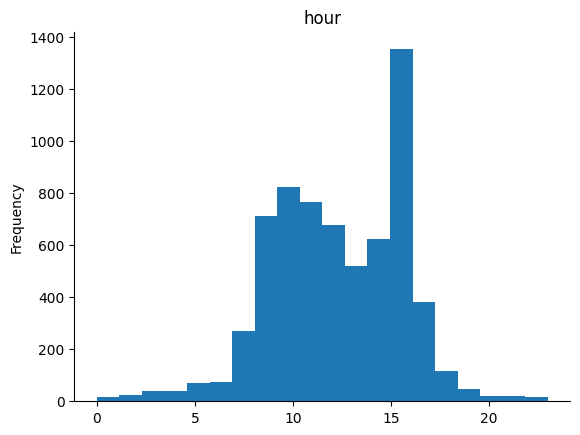

In [ ]:
# @title hour

from matplotlib import pyplot as plt
result_df['hour'].plot(kind='hist', bins=20, title='hour')
plt.gca().spines[['top', 'right',]].set_visible(False)

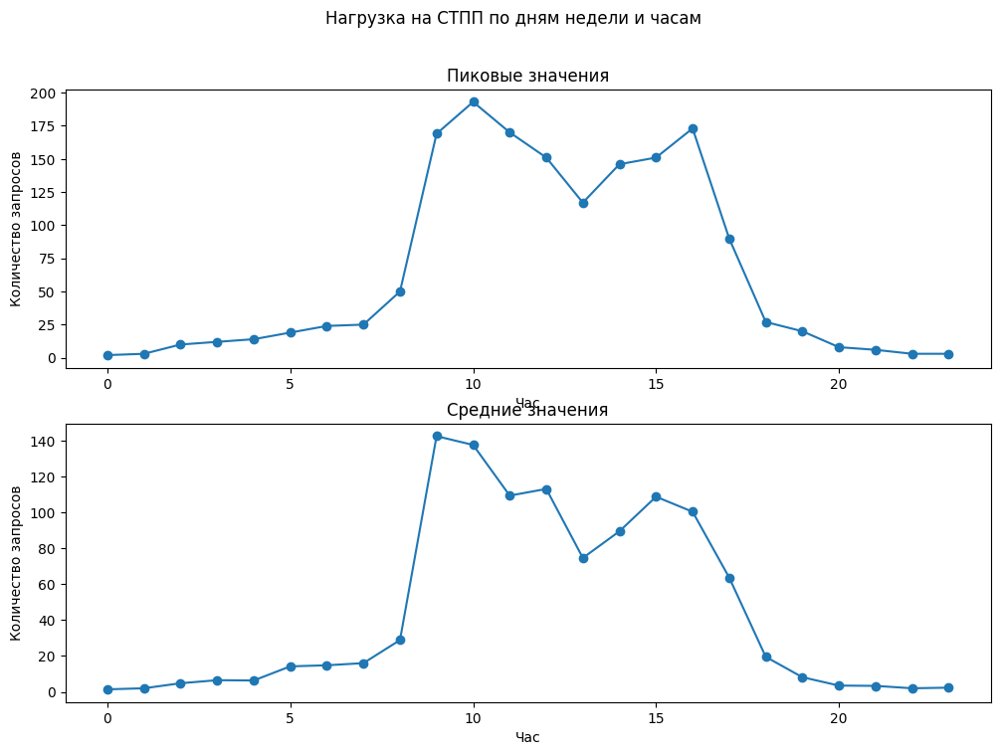

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка данных
data = result_df

# Добавление столбца с днем недели
data['weekday'] = data['date'].dt.weekday

# Сгруппировать данные по часам и дням недели
grouped_data = data.groupby(['weekday', 'hour'])['docid'].count().reset_index()

# Рассчитать количество запросов в каждый час и день
grouped_data = grouped_data.pivot_table(index='weekday', columns='hour', values='docid', aggfunc='sum')

# Определить пиковые и средние значения нагрузки на СТПП
peak_values = grouped_data.max(axis=0)
avg_values = grouped_data.mean(axis=0)

# Визуализировать результаты с помощью графиков и диаграмм
fig, axs = plt.subplots(2, figsize=(12, 8))
fig.suptitle('Нагрузка на СТПП по дням недели и часам')

axs[0].plot(peak_values.index, peak_values.values, marker='o')
axs[0].set_title('Пиковые значения')
axs[0].set_xlabel('Час')
axs[0].set_ylabel('Количество запросов')

axs[1].plot(avg_values.index, avg_values.values, marker='o')
axs[1].set_title('Средние значения')
axs[1].set_xlabel('Час')
axs[1].set_ylabel('Количество запросов')

plt.show()


Text(0, 0.5, 'Количество запросов')

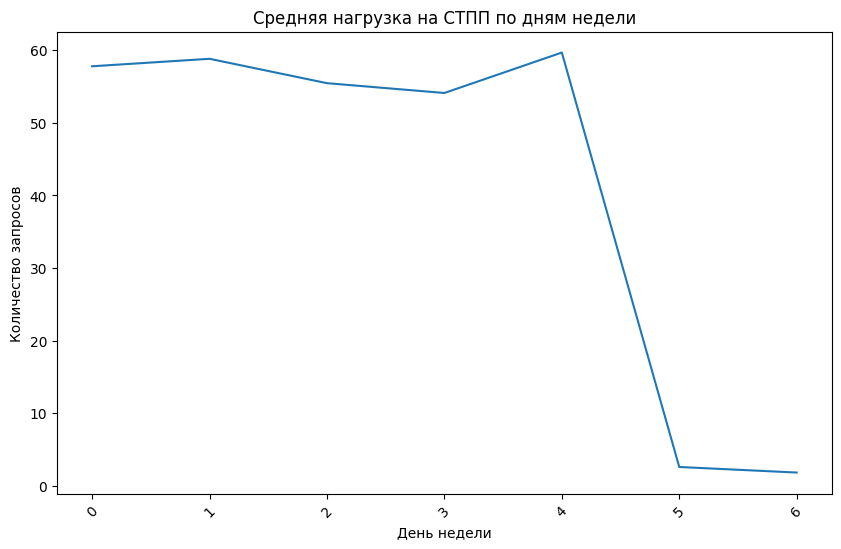

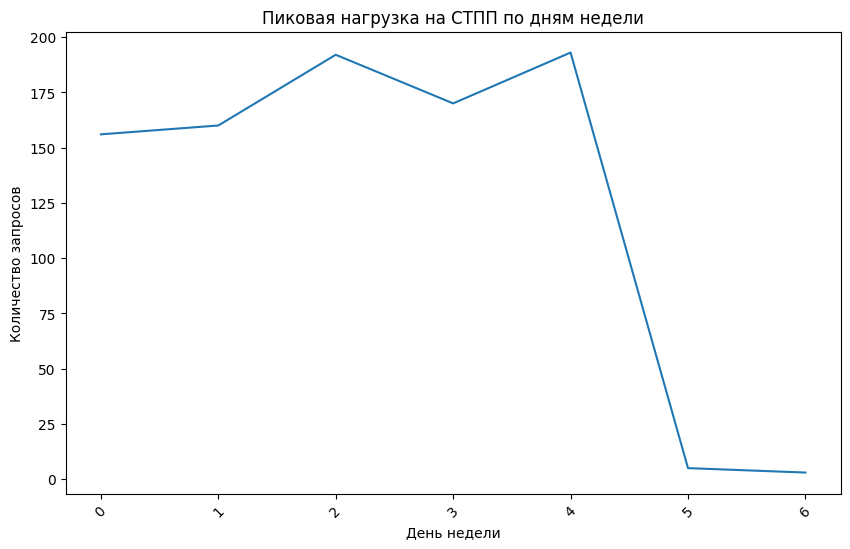

In [ ]:
df = result_df

# Преобразование столбца date в тип данных datetime
df['date'] = pd.to_datetime(df['date'])

# Добавление столбца с днем недели
df['weekday'] = df['date'].dt.weekday

# Группировка данных по дню недели и часу
grouped = df.groupby(['weekday', 'hour'])['docid'].count().reset_index()

# Рассчет среднего количества запросов для каждого дня недели и часа
grouped['mean_requests'] = grouped.groupby('weekday')['docid'].transform('mean')

# Рассчет пикового количества запросов для каждого дня недели и часа
grouped['peak_requests'] = grouped.groupby('weekday')['docid'].transform('max')

# Фильтрация данных для визуализации
weekday_mean = grouped.groupby('weekday')['mean_requests'].mean()
weekday_peak = grouped.groupby('weekday')['peak_requests'].max()

# Визуализация средних значений нагрузки на СТПП по дням недели
plt.figure(figsize=(10,6))
plt.plot(weekday_mean.index, weekday_mean.values)
plt.xticks(rotation=45)
plt.title('Средняя нагрузка на СТПП по дням недели')
plt.xlabel('День недели')
plt.ylabel('Количество запросов')

# Визуализация пиковых значений нагрузки на СТПП по дням недели
plt.figure(figsize=(10,6))
plt.plot(weekday_peak.index, weekday_peak.values)
plt.xticks(rotation=45)
plt.title('Пиковая нагрузка на СТПП по дням недели')
plt.xlabel('День недели')
plt.ylabel('Количество запросов')

In [ ]:
result_df

,docid,docnumber,docdate,parent,request,date,hour,name,federal_district,region_with_type,city,timezone,lat,lon,local_time,date_hour,weekday
0,414051,ОП-З-00073-001,2023-06-23 09:14:12.352472+03:00,413936,1022200907794,2023-06-23,0,"КГБОУ ""АЛТАЙСКИЙ КРАЕВОЙ ПЕДАГОГИЧЕСКИЙ ЛИЦЕЙ-...",Сибирский,Алтайский край,Барнаул,UTC+7,53.33927,83.767044,2023-06-23 13:14:12.352472+07:00,2023-06-23,4
1,412740,О-З-00017-002,2023-06-20 14:26:02.272314+03:00,412442,1030100510461,2023-06-20,0,УО АМО КОШЕХАБЛЬСКИЙ РАЙОН,Южный,Респ Адыгея,None,UTC+3,44.895884,40.492873,2023-06-20 14:26:02.272314+03:00,2023-06-20,1
2,412900,ОП-З-00028-001,2023-06-21 09:08:10.800947+03:00,412854,1024200721797,2023-06-21,0,"ГБНОУ ""ГМЛИ"", ГБНОУ ""ГУБЕРНАТОРСКИЙ МНОГОПРОФИ...",Сибирский,Кемеровская область - Кузбасс,Кемерово,UTC+7,55.3369049,86.1380722,2023-06-21 13:08:10.800947+07:00,2023-06-21,2
3,412304,ОП-З-00005-001,2023-06-19 16:39:11.096665+03:00,412293,1026605402394,2023-06-19,0,МАОУ СОШ № 76 С УГЛУБЛЕННЫМ ИЗУЧЕНИЕМ ОТДЕЛЬНЫ...,Уральский,Свердловская обл,Екатеринбург,UTC+5,56.8306504,60.6230595,2023-06-19 18:39:11.096665+05:00,2023-06-19,0
4,413761,ОП-З-00055-002,2023-06-22 14:44:21.289675+03:00,413570,1026401590610,2023-06-22,0,"МАОУ ""ГИМНАЗИЯ ИМЕНИ Ю.А. ГАРНАЕВА""",Приволжский,Саратовская обл,Балашов,UTC+4,51.5520858,43.1420728,2023-06-22 15:44:21.289675+04:00,2023-06-22,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6615,456664,З-01353,2023-08-31 10:17:01.555530+03:00,0,1022701290116,2023-08-31,0,МАОУ СОШ № 77,Дальневосточный,Хабаровский край,Хабаровск,UTC+10,48.5061333,135.0716054,2023-08-31 17:17:01.555530+10:00,2023-08-31,3
6616,458095,О-З-00484-001,2023-09-04 04:20:01.573455+03:00,428856,1022200814030,2023-09-04,0,"КГБПОУ ""РУБЦОВСКИЙ АГРАРНО-ПРОМЫШЛЕННЫЙ ТЕХНИКУМ""",Сибирский,Алтайский край,Рубцовск,UTC+7,51.524113,81.2151976,2023-09-04 08:20:01.573455+07:00,2023-09-04,0
6617,457918,О-З-01242-003,2023-09-01 16:14:01.734741+03:00,453037,1025602002007,2023-09-01,0,ГАПОУ ОНТ ИМ. В.А. СОРОКИНА,Приволжский,Оренбургская обл,Орск,UTC+5,51.2450357,58.4626669,2023-09-01 18:14:01.734741+05:00,2023-09-01,4
6618,464058,О-З-01517-001,2023-09-06 15:03:02.257644+03:00,462182,1022900540552,2023-09-06,0,"ГБПОУ АО ""АРХАНГЕЛЬСКИЙ ПЕДКОЛЛЕДЖ""",Северо-Западный,Архангельская обл,Архангельск,UTC+3,64.5317201,40.5672116,2023-09-06 15:03:02.257644+03:00,2023-09-06,2
